In [5]:
%load_ext autoreload
%autoreload 2

from pathlib import Path

from hloc import extract_features, match_features
from hloc.utils.io import read_image, get_keypoints, get_matches
from hloc.utils.viz import plot_images_vertically, plot_keypoints, plot_matches

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
# image_root = Path("datasets/sacre_coeur")
# image_path_list = [p.relative_to(image_root).as_posix() for p in (image_root / "mapping/").iterdir()]
# output_path = Path("outputs/demo/")

# image_root = Path("datasets/custom")
# image_path_list = sorted(
#     [p.relative_to(image_root).as_posix() for p in (image_root / "huzhou/").iterdir()],
#     key=lambda x: int(x.split("/")[-1].split(".")[0])
# )
# output_path = Path('outputs/custom/huzhou')

# image_root = Path("datasets/custom")
# image_path_list = sorted(
#     [p.relative_to(image_root).as_posix() for p in (image_root / "fh_color/").iterdir()],
#     key=lambda x: int(x.split('/')[-1].split('.')[0].split('_')[0])
# )
# output_path = Path('outputs/custom/fh_color')

image_root = Path("datasets/custom")
image_path_list = sorted(
    [p.relative_to(image_root).as_posix() for p in (image_root / "fh_gray/").iterdir()],
    key=lambda x: int(x.split('/')[-1].split('.')[0].split('_')[0])
)
output_path = Path('outputs/custom/fh_gray')

pair_path = output_path / "pairs-sfm.txt"
feature_path = output_path / "features.h5"
matche_path = output_path / "matches.h5"

# feature_conf = extract_features.confs['disk']
# matcher_conf = match_features.confs['disk+lightglue']

feature_conf = extract_features.confs['superpoint_max']
# matcher_conf = match_features.confs['superglue']
matcher_conf = match_features.confs['NN-superpoint']

# feature_conf = extract_features.confs['sift']
# matcher_conf = match_features.confs['NN-ratio']

In [ ]:
extract_features.main(
    feature_conf, image_root, image_list=image_path_list, feature_path=features, overwrite=True
)

In [7]:
image_list = [
    read_image(image_root / image_path, grayscale=False)
    for image_path in image_path_list
]

keypoint_list = [
    get_keypoints(feature_path, image_path) for image_path in image_path_list
]

with open(str(pair_path), "r") as f:
    pairs = [p.split() for p in f.readlines()[: len(image_list) - 1]]
match_list = [
    (matches, scores)
    for name0, name1 in pairs
    for matches, scores in [get_matches(matche_path, name0, name1)]
]

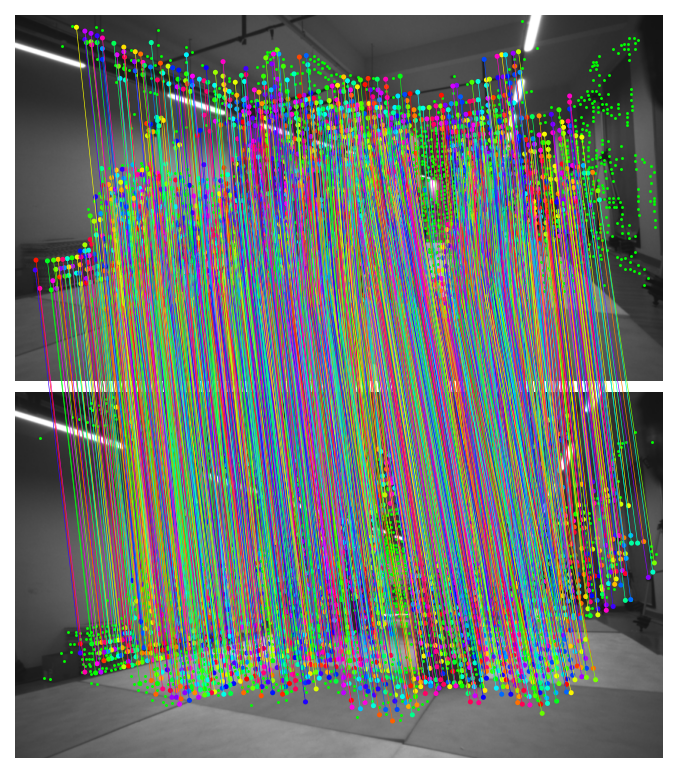

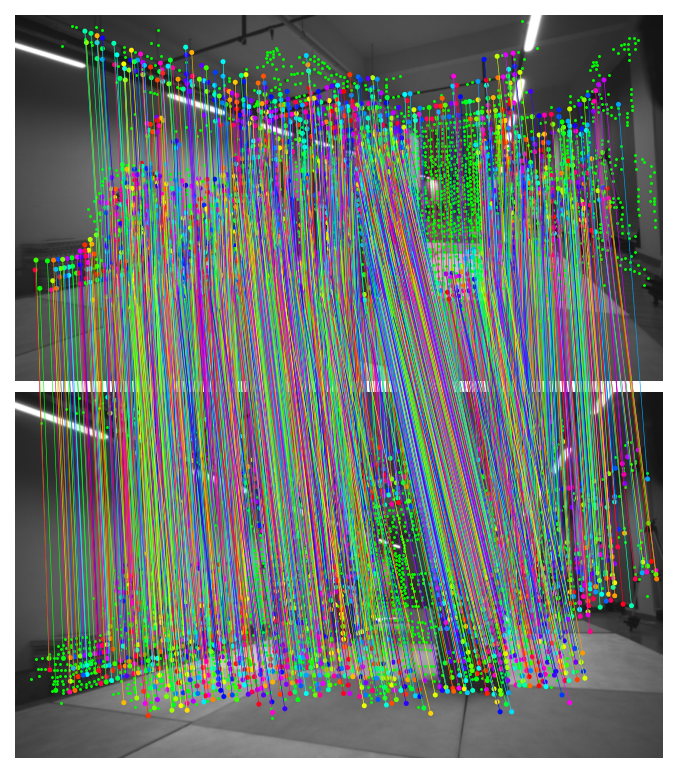

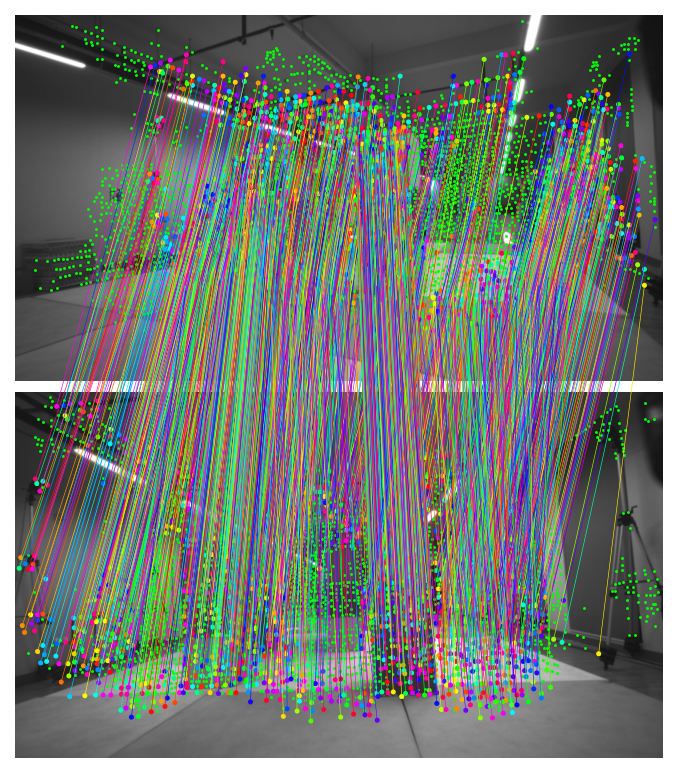

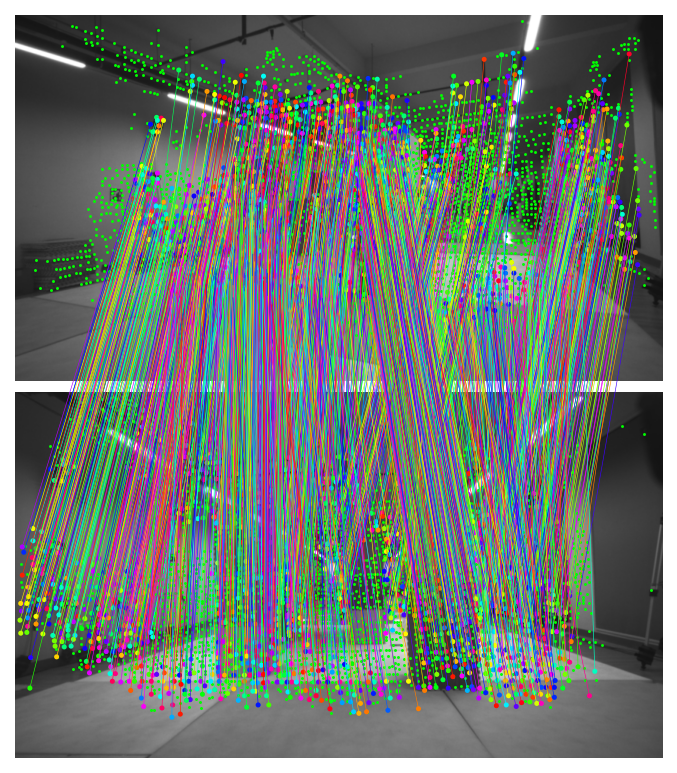

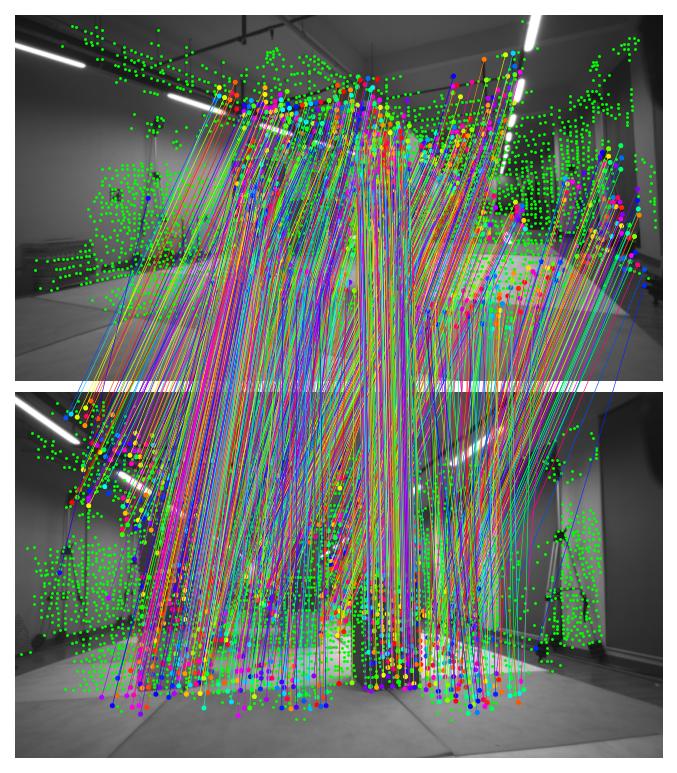

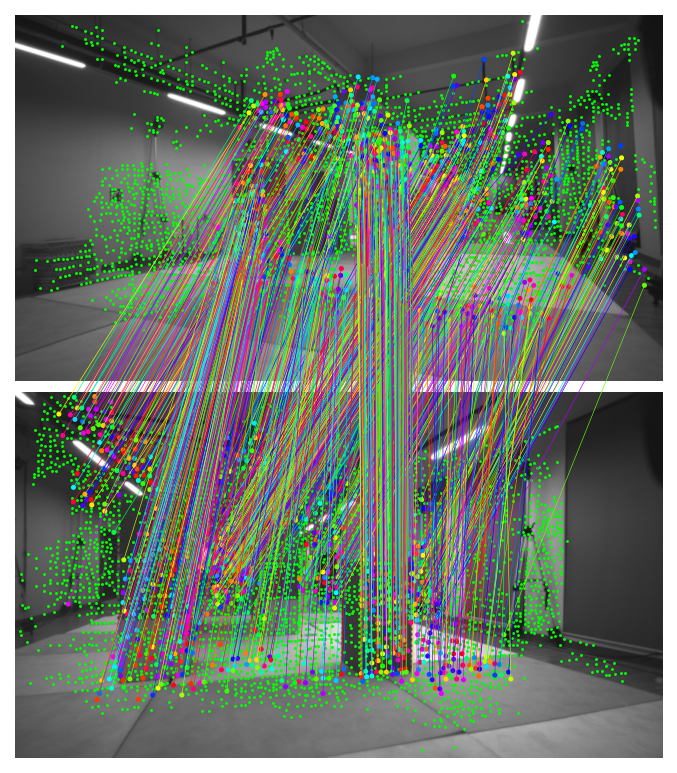

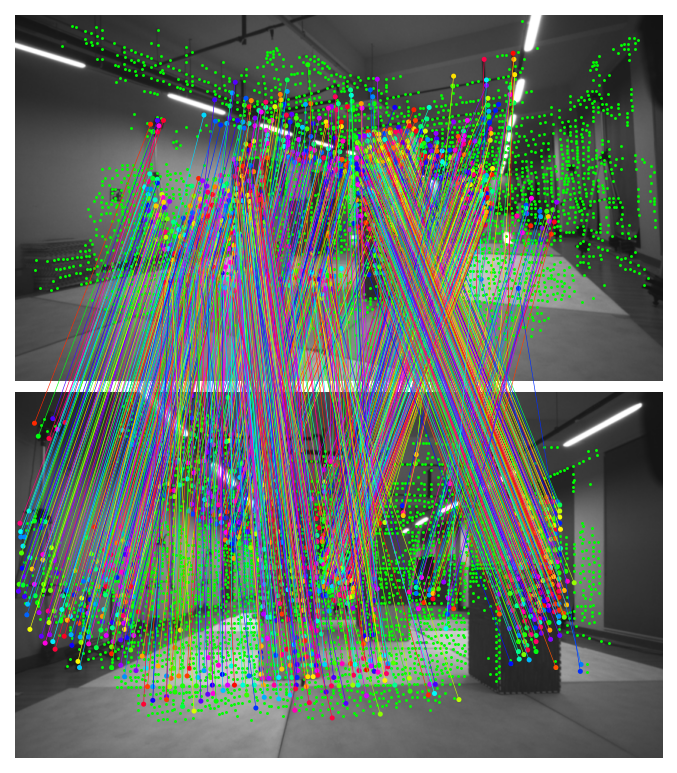

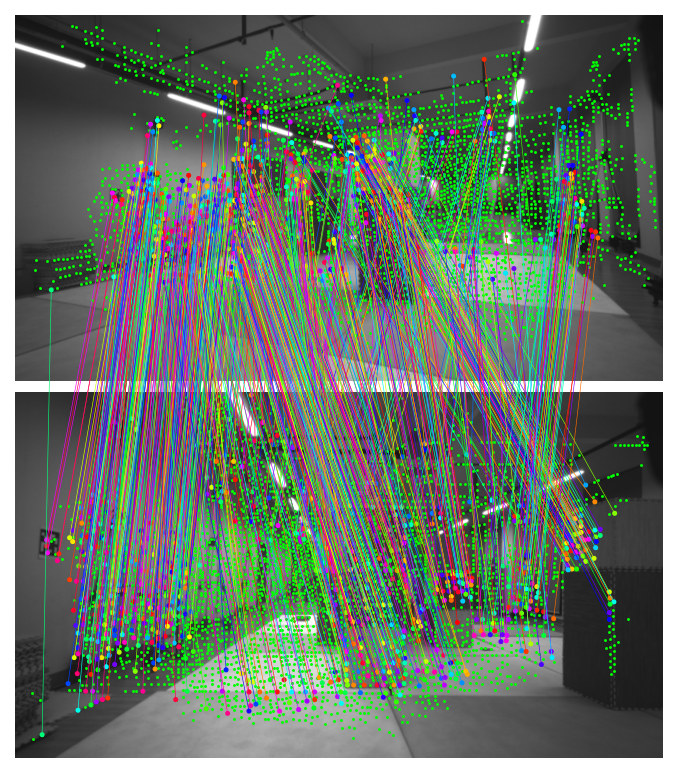

In [8]:
for i in range(len(image_list) - 1):
    plot_images_vertically([image_list[0], image_list[i + 1]], dpi=150)
    plot_keypoints([keypoint_list[0], keypoint_list[i + 1]], ps=2)
    idx_0 = match_list[i][0][:, 0]
    idx_i = match_list[i][0][:, 1]
    kps_0 = keypoint_list[0][idx_0]
    kps_i = keypoint_list[i + 1][idx_i]
    plot_matches(kps_0, kps_i, lw=.3, ps=2)